#SOLAR ENERGY PREDICTION USING WEATHER DATA

**GITHUB REPOSITORY :- https://github.com/yash1thredddy/Yoda_IDS-418b_Project**

**Project Introduction**

Our Problem Statement is to develop
precise short-term solar energy forecasts
using weather data to improve power
grid management. Logistics will be major part in any
power generation network, and we are
going to provide better estimate of the
logistics planning by estimating
intermittent solar energy generation
caused by weather by providing reliable
short-term forecasts for efficient grid
management and decision-making. We selected this issue due to the
growing significance of solar energy
and the challenges caused by its
irregularity. Our hypothesis is that using
historical weather data and advanced
predictive models can accurately predict
solar energy generation, improving grid
management and economic decisions. Our project contributes significantly to
the economic viability of solar energy.
Accurate forecasts minimize financial
losses, enhance solar power reliability,
and promote eco-friendly energy
adoption, ultimately curbing carbon
emissions.

**Data**

1. Our dataset includes 20 distinct features,
covering meteorological and
environmental data such as temperature,
humidity, cloud cover, wind characteristics,
and solar radiation.
2. All data in the dataset is empirical,
reflecting real-world observations.
3. We sourced this data from Kaggle's non-
competitive section, referred in final slide.
4. These empirical measurements
significantly influence solar power
generation, represented by the target
variable "generated_power_kw."
5. The dataset contains 4,213 records,
offering a substantial amount of empirical
data for analysis and modeling.

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [ ]:
dataframe = pd.read_csv ('spg.csv')

In [ ]:
import scipy.stats as stats

attributes = [
    'temperature_2_m_above_gnd',
    'relative_humidity_2_m_above_gnd',
    'total_cloud_cover_sfc',
    'wind_speed_10_m_above_gnd',
    'shortwave_radiation_backwards_sfc'
]

correlation_coefficients = []
p_values = []
t_statistics = []
t_p_values = []
mean_values = []
std_dev_values = []

for attribute in attributes:
    current_attribute = dataframe[attribute]

    # Pearson correlation coefficient
    correlation_coefficient, p_value = stats.pearsonr(current_attribute, dataframe['generated_power_kw'])
    correlation_coefficients.append(correlation_coefficient)
    p_values.append(p_value)

    # T-test for comparing means
    t_statistic, t_p_value = stats.ttest_ind(current_attribute, dataframe['generated_power_kw'])
    t_statistics.append(t_statistic)
    t_p_values.append(t_p_value)

    # Descriptive statistics
    mean_value = current_attribute.mean()
    std_dev_value = current_attribute.std()
    mean_values.append(mean_value)
    std_dev_values.append(std_dev_value)

    print(f"\nResults for {attribute}:")
    print(f"Pearson Correlation Coefficient: {correlation_coefficient:.4f}, p-value: {p_value:.4f}")
    print(f"T-test: t-statistic: {t_statistic:.4f}, p-value: {t_p_value:.4f}")
    print(f"Descriptive Statistics:")
    print(f"   - Mean {attribute}: {mean_value:.4f}")
    print(f"   - Standard Deviation {attribute}: {std_dev_value:.4f}")

average_correlation = sum(correlation_coefficients) / len(correlation_coefficients)
average_p_value = sum(p_values) / len(p_values)
print(f"\nAverage Pearson Correlation Coefficient: {average_correlation:.4f}")
print(f"Average p-value: {average_p_value:.4f}")



Results for temperature_2_m_above_gnd:
Pearson Correlation Coefficient: 0.2173, p-value: 0.0000
T-test: t-statistic: -77.4518, p-value: 0.0000
Descriptive Statistics:
   - Mean temperature_2_m_above_gnd: 15.0681
   - Standard Deviation temperature_2_m_above_gnd: 8.8537

Results for relative_humidity_2_m_above_gnd:
Pearson Correlation Coefficient: -0.3368, p-value: 0.0000
T-test: t-statistic: -74.9202, p-value: 0.0000
Descriptive Statistics:
   - Mean relative_humidity_2_m_above_gnd: 51.3610
   - Standard Deviation relative_humidity_2_m_above_gnd: 23.5259

Results for total_cloud_cover_sfc:
Pearson Correlation Coefficient: -0.3343, p-value: 0.0000
T-test: t-statistic: -76.0619, p-value: 0.0000
Descriptive Statistics:
   - Mean total_cloud_cover_sfc: 34.0570
   - Standard Deviation total_cloud_cover_sfc: 42.8436

Results for wind_speed_10_m_above_gnd:
Pearson Correlation Coefficient: -0.0830, p-value: 0.0000
T-test: t-statistic: -77.3707, p-value: 0.0000
Descriptive Statistics:
   - Mea

The average Pearson correlation coefficient across all attributes is 0.0039, indicating a very weak overall linear relationship.
However, considering the individual attributes, shortwave radiation stands out as a particularly influential factor in solar power generation, demonstrating a strong positive correlation. Other factors such as temperature, relative humidity, cloud cover, and wind speed also show significant associations, contributing to a nuanced understanding of their impact on the system. The consistently low p-values underscore the statistical significance of these findings.

# Visualization 1: Boxplot

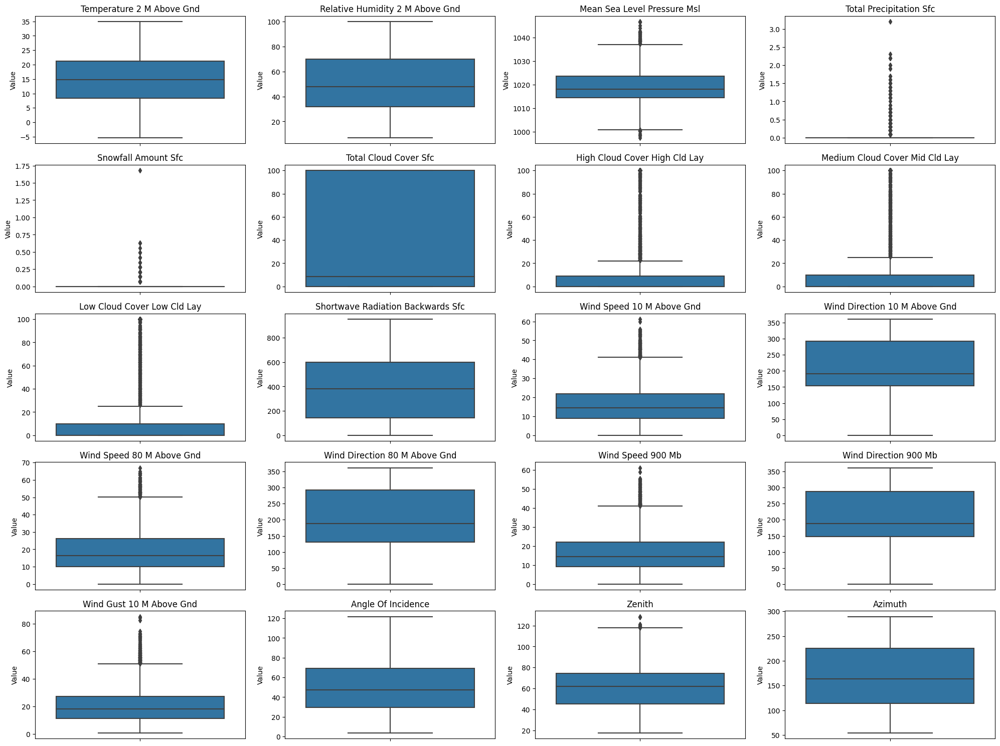

In [ ]:
num_features = 20
features = dataframe.columns[:num_features]


plt.figure(figsize=(20, 15))


for i, feature in enumerate(features, 1):
    plt.subplot(5, 4, i)
    sns.boxplot(y=dataframe[feature])
    plt.title(feature.replace('_', ' ').title())
    plt.ylabel('Value')

plt.tight_layout()
plt.show()

**Analysis and Decision on Outliers in Weather Dataset for Power Generation Prediction**

We conducted an in-depth analysis of a weather dataset, focusing on the role of outliers in the context of predicting generated power through machine learning models. The analysis combined descriptive statistics and box plot visualizations to assess the distribution and impact of outliers across various weather-related features.

**Key Observations:**
Presence of Outliers in Specific Features:

**Weather Extremes:** Features such as total_precipitation_sfc and snowfall_amount_sfc showed significant outliers, likely reflecting rare, extreme weather conditions.
Wind Speed Variations: Outliers in features like wind_gust_10_m_above_gnd and wind_speed_80_m_above_gnd indicated instances of unusually high wind speeds.
General Distribution Across Features:

Other features, including temperature_2_m_above_gnd and relative_humidity_2_m_above_gnd, displayed more uniform distributions with fewer extreme outliers, suggesting a balanced representation of typical weather conditions.

**Minor Outliers:**

Some features exhibited minor outliers (e.g., angle_of_incidence), but these were not excessively pronounced.
Decision and Rationale:
**Continuing with Outliers:** After careful consideration, the decision is to retain the outliers within the dataset for the current phase of modeling. This approach acknowledges the potential value of the full range of data, including extreme conditions, in training the predictive model.

**Informed by Context and Goals:** This decision is guided by the understanding that the predictive model aims to capture a comprehensive picture of weather impacts on power generation, encompassing both typical and extreme conditions.

**Future Reassessment:** While we proceed with the outliers at present, we remain open to revisiting this decision in later stages, especially after evaluating the initial model's performance and its ability to generalize across different weather scenarios.

# Visualization 2: Histogram

The dataset's histograms reveal diverse distributions across meteorological and power generation variables. Temperature and pressure display normal distributions, while precipitation and power generation are right-skewed. These patterns inform the selection of regression models and highlight the need for data transformation in predictive analytics, crucial for optimizing resource allocation and strategic decision-making.

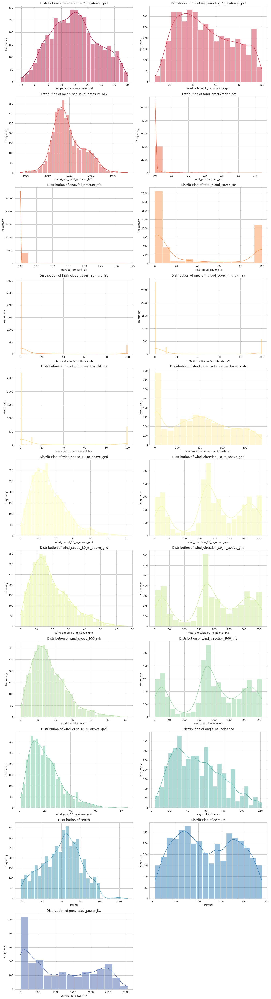

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from itertools import cycle


sns.set_style("whitegrid")


plt.rcParams.update({'figure.max_open_warning': 0})


numeric_cols = dataframe.select_dtypes(include=['float64', 'int64']).columns.tolist()


colors = cycle(sns.color_palette("Spectral", n_colors=len(numeric_cols)))


cols_per_row = 2
num_rows = len(numeric_cols) // cols_per_row + (len(numeric_cols) % cols_per_row > 0)
fig, axes = plt.subplots(num_rows, cols_per_row, figsize=(15, num_rows * 5))


for i, col in enumerate(numeric_cols):
    ax = axes[i // cols_per_row, i % cols_per_row]
    color = next(colors)
    sns.histplot(dataframe[col], kde=True, color=color, ax=ax)
    ax.set_title(f'Distribution of {col}')
    ax.set_xlabel(col)
    ax.set_ylabel('Frequency')

if len(numeric_cols) % cols_per_row != 0:
    fig.delaxes(axes[-1, -1])

plt.tight_layout()
plt.show()


### Analysis and Decision on Model Selection


**Normal and Skewed Distributions:** Variables like temperature, pressure, and zenith angles appear to follow a normal distribution, suggesting that simple linear regression could effectively model the relationship between these variables and outcomes like energy consumption or generation. Other variables, such as precipitation, snowfall, and generated power, show right-skewed distributions. For these, transformations (like log transformation) or non-linear models may be more appropriate.

**Seasonal Patterns:** The bimodal distributions seen in variables like shortwave radiation and azimuth suggest seasonal patterns. For such cases, including seasonal cycles as part of the regression model, or using time series analysis, can improve the accuracy of predictions.

**Variable Relationships:** Understanding how these variables interact with each other is crucial. For example, solar power generation would be closely tied to shortwave radiation and cloud cover. Multivariate regression can help quantify these relationships and predict outcomes based on several input variables.

**Anomalies and Outliers:** Some histograms have bars that are separated from the main body of the graph, which could indicate outliers or anomalies in the data. It's important to determine whether to include these in your regression analysis or to treat them separately.

**Potential for Predictive Models:** With variables like wind speed and direction at various atmospheric levels, predictive models can be built to forecast wind power generation. Similarly, solar power generation could be predicted with variables like shortwave radiation, zenith, and azimuth.

**Model Selection:** Based on the distribution of our data, different regression algorithms could be applied. For normally distributed data, linear regression or Gaussian processes might be suitable. For non-linear relationships, algorithms like polynomial regression, support vector machines with non-linear kernels, or neural networks might be more effective.


### In terms of actions:

**Optimization:** We can use the regression models to optimize for the variables that most influence renewable energy production, like adjusting the angles of solar panels according to the predicted solar position (zenith and azimuth) or positioning wind turbines based on predicted wind patterns.

**Forecasting:** Develop forecasting models for weather-dependent variables to predict future trends and prepare accordingly, which is crucial for sectors like agriculture, energy, and logistics.

**Risk Management:** For variables with high variability and unpredictability (like precipitation), you might focus on risk management strategies to mitigate potential negative impacts, such as flood or drought preparation plans.

**Policy Making:** For broader applications, such as urban planning or energy policy, this data can inform decisions on where to invest in renewable energy infrastructure or how to design cities to be more resilient against climate variability.








**Visualization 3: Scatter Plot**

In this **scatter plot analysis**, we examine the interplay between temperature, cloud cover, and generated power. Each point on the plot corresponds to a specific temperature value, with color indicating the level of cloud cover. By visualizing these relationships, we can quickly discern patterns and potential correlations. The scatter plot includes a regression line to highlight trends in how temperature and cloud cover impact the amount of power generated. This graphical representation is essential for intuitively grasping the influence of these attributes on the efficiency of a solar energy system. The simplicity of the scatter plot allows for a straightforward interpretation of the connections between temperature, cloud cover, and power generation, providing a solid foundation for further analysis.

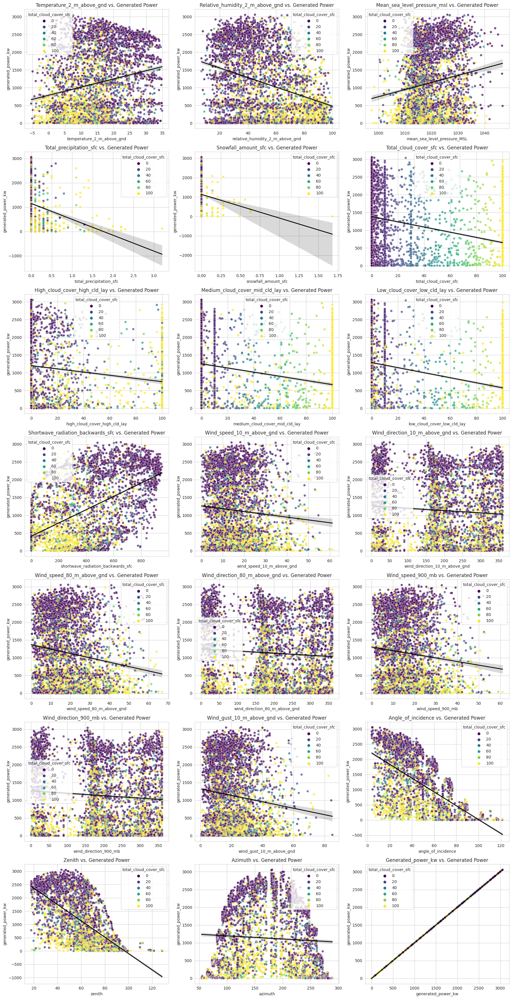

In [ ]:
colors = sns.color_palette('viridis', as_cmap=True)
attributes_to_plot = [col for col in dataframe.columns]
num_attributes = len(attributes_to_plot)
num_cols = 3
num_rows = -(-num_attributes // num_cols)
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(18, 5 * num_rows))
axes = axes.flatten()

legend_dict = {}

for i, attribute in enumerate(attributes_to_plot):
    scatter = sns.scatterplot(
        x=attribute,
        y='generated_power_kw',
        hue='total_cloud_cover_sfc',
        palette=colors,
        data=dataframe,
        alpha=0.7,
        ax=axes[i],
        s=35
    )

    sns.regplot(
        x=attribute,
        y='generated_power_kw',
        data=dataframe,
        scatter=False,
        color='black',
        line_kws={'linewidth': 2},
        ax=axes[i]
    )
    axes[i].set_title(f'{attribute.capitalize()} vs. Generated Power')
    handles, labels = scatter.get_legend_handles_labels()
    legend_dict.update(dict(zip(labels, handles)))

plt.tight_layout()
plt.show()

**In conclusion**, the positive slope of the regression line in our scatter plot reveals a clear positive correlation between temperature and generated power. This suggests that as temperature increases, the system's power generation tends to rise. The visual representation of this relationship underscores the importance of considering temperature as a significant factor in optimizing solar power systems. The positive correlation aligns with expectations, as higher temperatures generally enhance the efficiency of solar panels. Understanding and leveraging this positive relationship between temperature and generated power can inform better operational strategies and contribute to the overall efficiency and effectiveness of the solar energy system.

**Visualization 4: Cohert Plots**

In this project, cohort plots with kernel density estimation (KDE) were chosen over traditional scatter plots to explore relationships between numeric attributes and generated power in a solar energy system. Cohort plots offer a nuanced view, crucial for understanding how variations in attributes impact power generation. Unlike scatter plots, cohort plots reveal concentration and density patterns, particularly valuable when analyzing multiple numeric variables concurrently.

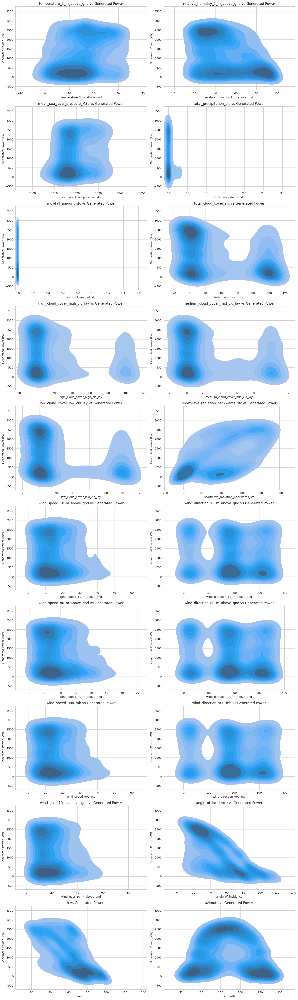

In [ ]:
numeric_cols = dataframe.select_dtypes(include=np.number).columns.drop('generated_power_kw')

num_cols = 2
num_rows = len(numeric_cols) // num_cols + (len(numeric_cols) % num_cols > 0)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))
axes = axes.flatten()

for ax, col in zip(axes, numeric_cols):
    sns.kdeplot(x=dataframe[col], y=dataframe['generated_power_kw'], fill=True, ax=ax)
    ax.set_title(f'{col} vs Generated Power')
    ax.set_xlabel(col)
    ax.set_ylabel('Generated Power (kW)')

for i in range(len(numeric_cols), num_rows * num_cols):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()


**Outcome and Utility:**

The cohort plots for key attributes like temperature, cloud cover, wind speed, and shortwave radiation reveal valuable insights. For instance, temperature displays a positive correlation with power generation, while cloud cover and wind speed show nuanced impacts. This nuanced perspective guides optimization strategies for solar energy systems, making cohort plots a valuable tool for uncovering intricate dynamics and understanding attribute-specific influences on power generation.

**Visualization 5: Correlation Heatmaps**


Temperature (2 m above ground): Exhibits a moderate negative correlation with generated_power_kw, suggesting higher temperatures may hinder power generation.

Relative Humidity (2 m above ground): Shows a slight negative correlation, indicating more humidity may marginally reduce power output.

Sea Level Pressure: Presents a weak negative correlation, hinting at a potential slight decrease in power generation with higher pressure.

Total Cloud Cover: Has a moderate negative correlation, as more clouds typically lead to less solar radiation and, therefore, lower solar power generation.

Mid and High Cloud Cover Layers: Similar to total cloud cover, they have a negative impact on power generation, albeit slightly weaker.

Radiation: ve_radiation_backwards_sfc correlates strongly and positively, making it a key predictor of higher power generation.

Wind Speed (10 m and 900 mb): Shows negligible correlations, suggesting wind speed has little linear influence on power generation.

Wind Direction: Displays no significant correlation, indicating wind direction's minimal linear effect on power generation.

Angle of Incidence and Zenith: Both have strong negative correlations with power generation, critical in solar power where the sun's angle can greatly affect output.

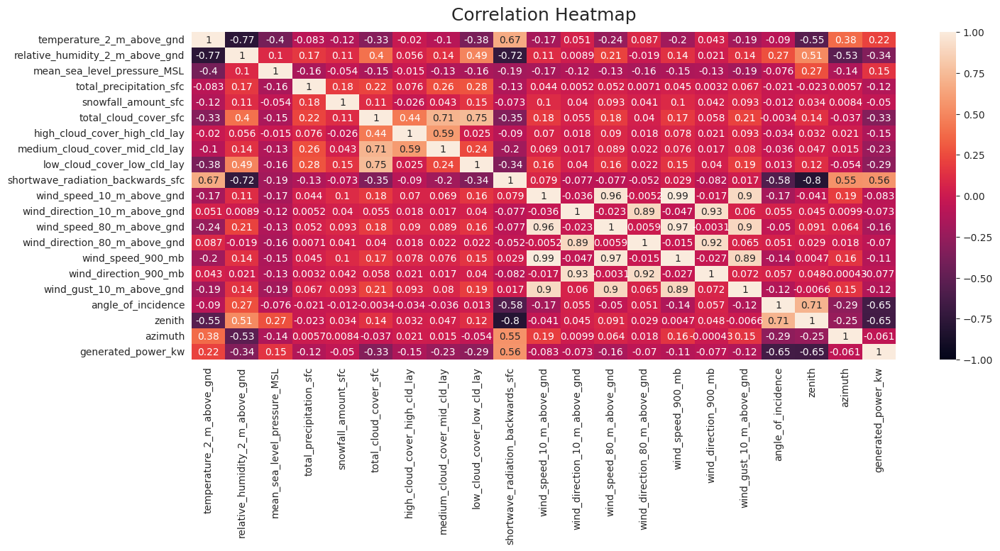

In [ ]:
plt.figure(figsize=(16, 6))
heatmap = sns.heatmap(dataframe.corr(), vmin=-1, vmax=1, annot=True)
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':18}, pad=12);


<ipython-input-9-5365ce1266af>:2: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.triu(np.ones_like(dataframe.corr(), dtype=np.bool))


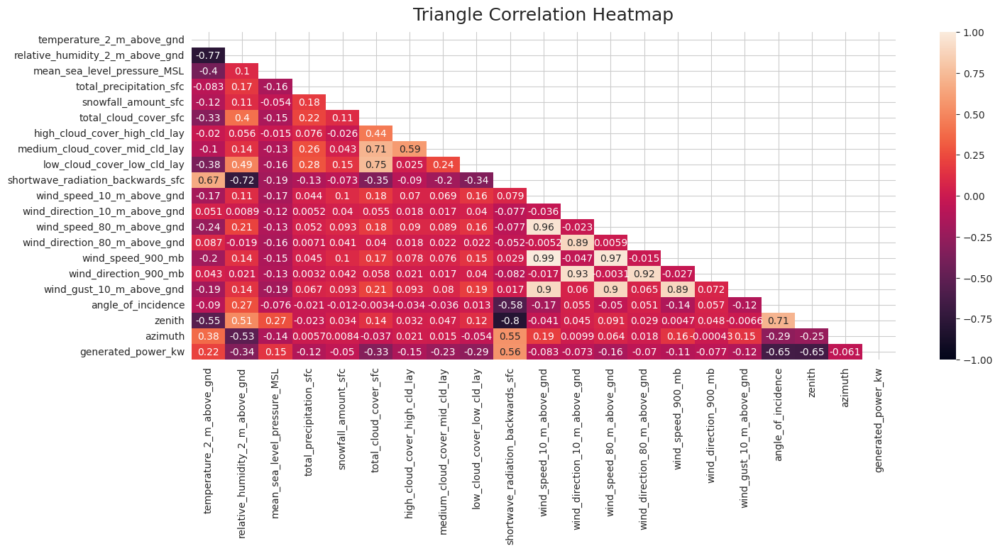

In [ ]:
plt.figure(figsize=(16, 6))
mask = np.triu(np.ones_like(dataframe.corr(), dtype=np.bool))
heatmap = sns.heatmap(dataframe.corr(), mask=mask, vmin=-1, vmax=1, annot=True)
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':18}, pad=12);

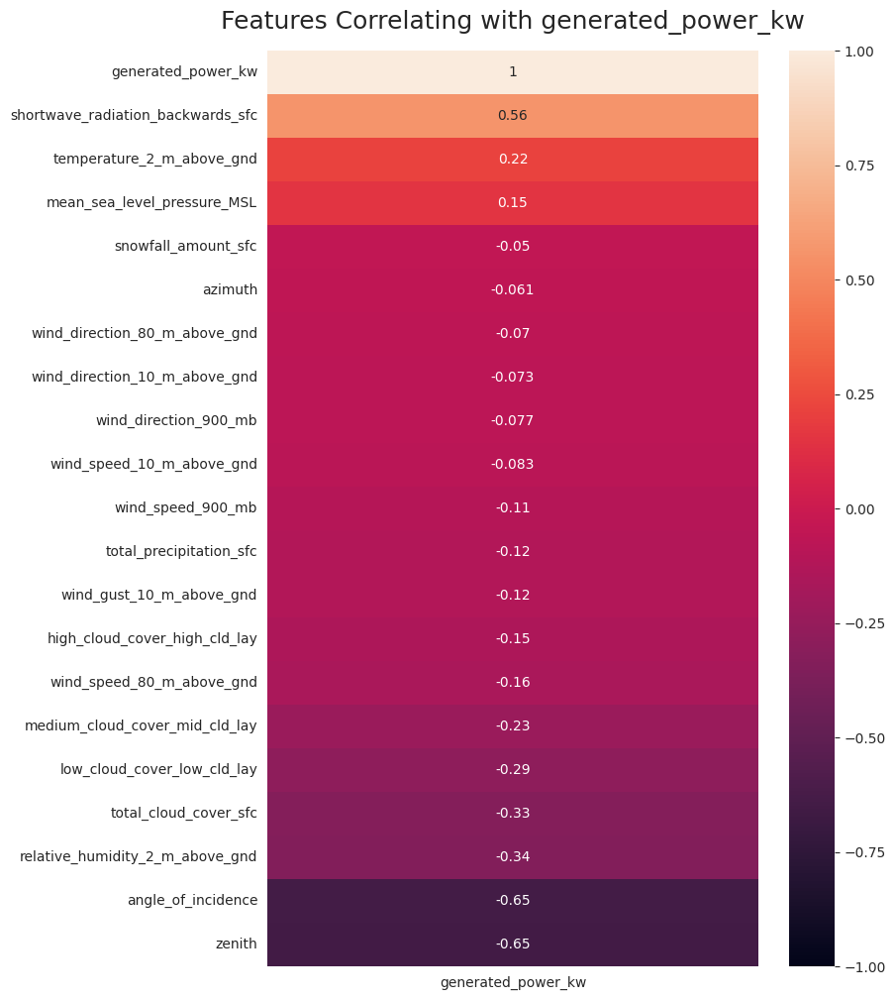

In [ ]:
plt.figure(figsize=(8, 12))
heatmap = sns.heatmap(dataframe.corr()[['generated_power_kw']].sort_values(by='generated_power_kw', ascending=False), vmin=-1, vmax=1, annot=True)
heatmap.set_title('Features Correlating with generated_power_kw', fontdict={'fontsize':18}, pad=16);

**Applying Random Forest Regressor**

**Random Forest Regressor:**

**Strengths:** Handles non-linear relationships well, less likely to overfit than some other models, and is robust to outliers.

**Usage:** Especially effective if the relationships in your data are complex and not easily captured by a linear model.

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

X = dataframe.drop('generated_power_kw', axis=1)
y = dataframe['generated_power_kw']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

y_pred = rf_model.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error (MSE): {mse}")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R-squared (R²) Score: {r2}")


Mean Squared Error (MSE): 166252.43916617727
Mean Absolute Error (MAE): 255.60428237061896
Root Mean Squared Error (RMSE): 407.7406518440089
R-squared (R²) Score: 0.8179977737567237


**Applying Gradient Boosting Regressor**

**Strengths:** Often provides high predictive accuracy, handles a mix of categorical and numerical features well, and can capture complex non-linear relationships.

**Usage:** Useful if you require a model thất can capture complex patterns in the data. Gradient boosting can be more sensitive to overfitting and requires careful tuning of parameters.

In [ ]:
X = dataframe.drop('generated_power_kw', axis=1)
y = dataframe['generated_power_kw']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

gb_model = GradientBoostingRegressor(n_estimators=100, random_state=42)
gb_model.fit(X_train, y_train)

y_pred_gb = gb_model.predict(X_test)

mse_gb = mean_squared_error(y_test, y_pred_gb)
mae_gb = mean_absolute_error(y_test, y_pred_gb)
rmse_gb = np.sqrt(mse_gb)
r2_gb = r2_score(y_test, y_pred_gb)

print(f"Mean Squared Error (MSE): {mse_gb}")
print(f"Mean Absolute Error (MAE): {mae_gb}")
print(f"Root Mean Squared Error (RMSE): {rmse_gb}")
print(f"R-squared (R²) Score: {r2_gb}")


Mean Squared Error (MSE): 180797.22558519602
Mean Absolute Error (MAE): 286.89391731993425
Root Mean Squared Error (RMSE): 425.2025700594906
R-squared (R²) Score: 0.8020750990472814


Comparing these results with the Random Forest Regressor:

The Random Forest Regressor had a slightly lower MSE, MAE, and RMSE, and a higher R≥ score.
The Gradient Boosting Regressor, while still performing well, is slightly less accurate in this case according to these metrics.

This comparison suggests that for this particular dataset, the Random Forest Regressor might be a more suitable choice. However, it's important to consider other factors like model complexity, training time, and the specific requirements of your application when making a final decision.

**Correlation Coefficient** is a measure of the linear relationship between the temperature and generated power in our dataset.

Here's a detailed interpretation:

**Correlation Coefficient Value:**
The correlation coefficient ranges from -1 to 1. A value of 0 indicates no linear correlation, a value of 1 indicates a perfect positive linear correlation, and a value of -1 indicates a perfect negative linear correlation.

In summary, understanding these correlations aids in identifying key factors influencing power generation, providing insights for system optimization and operational planning

In [ ]:
correlations = dataframe.corr()['generated_power_kw']

Corre_coeff_Desc = correlations.drop('generated_power_kw').sort_values(ascending=False)

print("Correlation Coefficients (Descending Order):")
for attribute, correlation in Corre_coeff_Desc.items():
    print(f"{attribute.capitalize()} vs. Power: {correlation:.4f}")

Correlation Coefficients (Descending Order):
Shortwave_radiation_backwards_sfc vs. Power: 0.5561
Temperature_2_m_above_gnd vs. Power: 0.2173
Mean_sea_level_pressure_msl vs. Power: 0.1506
Snowfall_amount_sfc vs. Power: -0.0495
Azimuth vs. Power: -0.0612
Wind_direction_80_m_above_gnd vs. Power: -0.0699
Wind_direction_10_m_above_gnd vs. Power: -0.0733
Wind_direction_900_mb vs. Power: -0.0774
Wind_speed_10_m_above_gnd vs. Power: -0.0830
Wind_speed_900_mb vs. Power: -0.1076
Total_precipitation_sfc vs. Power: -0.1184
Wind_gust_10_m_above_gnd vs. Power: -0.1228
High_cloud_cover_high_cld_lay vs. Power: -0.1477
Wind_speed_80_m_above_gnd vs. Power: -0.1579
Medium_cloud_cover_mid_cld_lay vs. Power: -0.2278
Low_cloud_cover_low_cld_lay vs. Power: -0.2881
Total_cloud_cover_sfc vs. Power: -0.3343
Relative_humidity_2_m_above_gnd vs. Power: -0.3368
Angle_of_incidence vs. Power: -0.6465
Zenith vs. Power: -0.6500


**Conclusion:**

**Most Important Factor:** Among the attributes considered, the correlation coefficients indicate that shortwave radiation (incoming solar radiation) has the highest positive correlation with power generation (0.5561). This suggests that the availability of sunlight significantly influences the amount of power generated in the solar energy system.

**Additional Insights:**
While temperature also shows a positive correlation, it is weaker (0.2173) compared to shortwave radiation.
Total cloud cover exhibits a moderate negative correlation, highlighting the impact of clouds on reducing power output.
Wind speed has a very weak negative correlation, suggesting minimal influence on power generation in this context.

**System Optimization:** To optimize power generation in a solar energy system, it's crucial to prioritize factors that maximize shortwave radiation exposure, such as minimizing cloud cover and ensuring proper orientation of solar panels to capture sunlight effectively.

**Considerations for Decision-Making:** When making decisions related to power generation, focusing on maximizing exposure to sunlight and minimizing factors that reduce solar radiation could lead to improved system performance.

# Applying GBM and XGBoost Models

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score


X = dataframe.drop('generated_power_kw', axis=1)
y = dataframe['generated_power_kw']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

gbm = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)
gbm.fit(X_train, y_train)


xgb = XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)
xgb.fit(X_train, y_train)


y_pred_gbm = gbm.predict(X_test)
y_pred_xgb = xgb.predict(X_test)


mse_gbm = mean_squared_error(y_test, y_pred_gbm)
r2_gbm = r2_score(y_test, y_pred_gbm)
rmse_gbm = mean_squared_error(y_test, y_pred_gbm, squared=False)

mse_xgb = mean_squared_error(y_test, y_pred_xgb)
r2_xgb = r2_score(y_test, y_pred_xgb)
rmse_xgb = mean_squared_error(y_test, y_pred_xgb, squared=False)


print("GradientBoostingRegressor:")
print(f'Mean Squared Error: {mse_gbm}')
print(f'R-squared: {r2_gbm}')
print(f'RMSE: {rmse_gbm}')
print("\nXGBRegressor:")
print(f'Mean Squared Error: {mse_xgb}')
print(f'R-squared: {r2_xgb}')
print(f'RMSE: {rmse_xgb}')



GradientBoostingRegressor:
Mean Squared Error: 180797.22558519602
R-squared: 0.8020750990472814
RMSE: 425.2025700594906

XGBRegressor:
Mean Squared Error: 179288.61283240584
R-squared: 0.8037266289792565
RMSE: 423.42486090498494


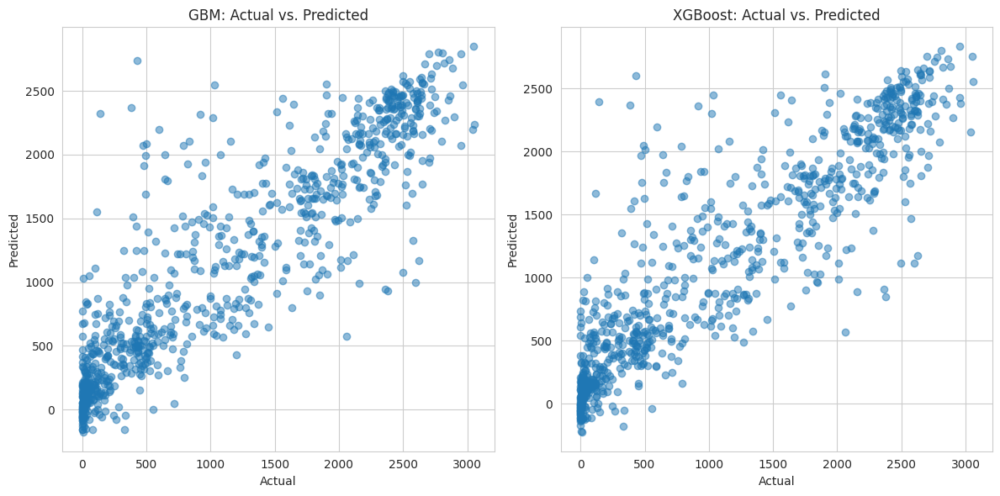

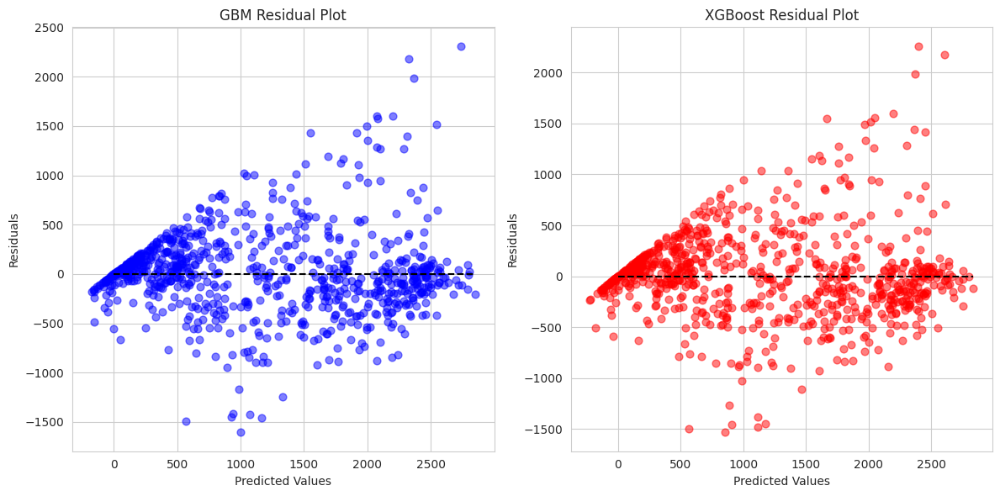

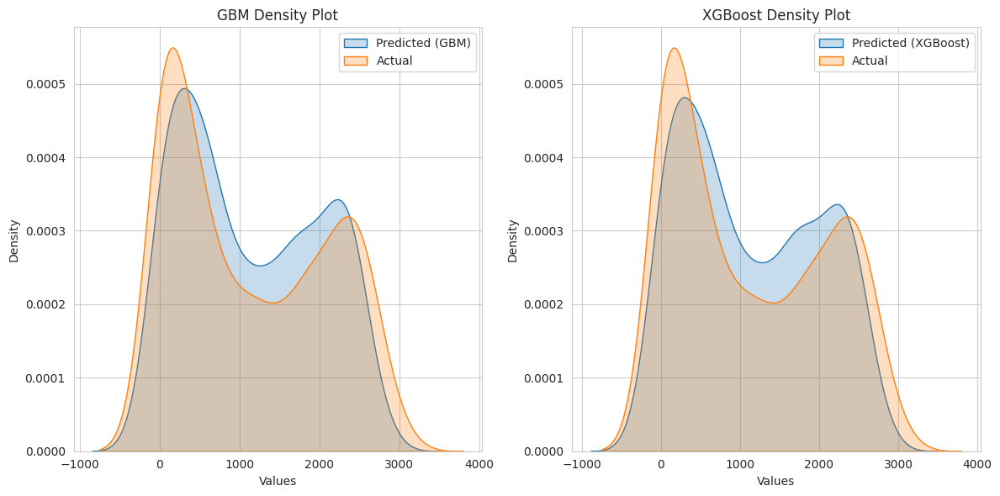

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")


y_pred_gbm = gbm.predict(X_test)
y_pred_xgb = xgb.predict(X_test)

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.scatter(y_test, y_pred_gbm, alpha=0.5)
plt.title('GBM: Actual vs. Predicted')
plt.xlabel('Actual')
plt.ylabel('Predicted')

plt.subplot(1, 2, 2)
plt.scatter(y_test, y_pred_xgb, alpha=0.5)
plt.title('XGBoost: Actual vs. Predicted')
plt.xlabel('Actual')
plt.ylabel('Predicted')

plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.scatter(y_pred_gbm, y_pred_gbm - y_test, c='b', s=40, alpha=0.5)
plt.hlines(y=0, xmin=0, xmax=max(y_pred_gbm), colors='k', linestyles='dashed')
plt.title('GBM Residual Plot')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')

plt.subplot(1, 2, 2)
plt.scatter(y_pred_xgb, y_pred_xgb - y_test, c='r', s=40, alpha=0.5)
plt.hlines(y=0, xmin=0, xmax=max(y_pred_xgb), colors='k', linestyles='dashed')
plt.title('XGBoost Residual Plot')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')

plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.kdeplot(y_pred_gbm, label='Predicted (GBM)', shade=True)
sns.kdeplot(y_test, label='Actual', shade=True)
plt.title('GBM Density Plot')
plt.xlabel('Values')
plt.ylabel('Density')
plt.legend()

plt.subplot(1, 2, 2)
sns.kdeplot(y_pred_xgb, label='Predicted (XGBoost)', shade=True)
sns.kdeplot(y_test, label='Actual', shade=True)
plt.title('XGBoost Density Plot')
plt.xlabel('Values')
plt.ylabel('Density')
plt.legend()

plt.tight_layout()
plt.show()


## Model Performance Analysis
### Overview
The performance of two advanced ensemble learning models, the Gradient Boosting Machine (GBM) and XGBoost, was evaluated on a solar energy power generation dataset. The assessment was conducted using residual plots, density plots, and quantitative metrics such as Mean Squared Error (MSE), R-squared, and Root Mean Squared Error (RMSE).

### Quantitative Metrics
**GBM:** Exhibited an MSE of 180797.22, an R-squared of 0.802, and an RMSE of 425.20.  


**XGBoost:** Showed a slightly improved performance with an MSE of 179288.61, an R-squared of 0.803, and an RMSE of 423.42.


The R-squared values for both models suggest that approximately 80% of the variability in solar power generation can be explained by the predictive features utilized in the models. The RMSE values, while relatively close between the two models, indicate the average deviation of the predicted values from the actual generated power.

### Residual Plot Analysis
**GBM Residuals:** The residuals displayed a pattern indicative of overestimation, particularly for mid-range predicted values. The lack of symmetry around the zero line in the residuals suggests systematic bias in this range.  

**XGBoost Residuals:** A wider spread of residuals for higher predicted values was observed, revealing potential heteroscedasticity issues and implying that predictions become less accurate as the predicted power generation increases.

### Conclusions and Recommendations
While both models perform robustly for a significant portion of the data, there are clear opportunities for improvement, especially in accurately predicting higher values of power generation. To enhance model performance, the following steps are recommended:

**Data Transformation:** To address the non-uniform variance and the skewness in residuals, data transformation techniques may be beneficial.
Hyperparameter Optimization: Fine-tuning the models' hyperparameters through methods like grid search or random search could yield improvements in prediction accuracy.


**Feature Engineering:** Developing additional features or transforming existing ones could help capture the underlying patterns in the data more effectively.


**Error Analysis:** A deeper dive into the specific areas where the models are underperforming could lead to targeted improvements.


**Alternative Modeling Techniques:** Investigating other regression techniques may offer improvements or insights that the current models do not capture.

**Regularization Strategies:** Implementing regularization might help mitigate overfitting, particularly for the XGBoost model.

# **Reflection**

**What is the most challenging part of the project that you have encountered so far?**

The most challenging part of the project so far has been understanding the 20 features in the dataset and how they impact the final outcome. The data is related to climate data, which by nature includes extreme data as important information. Handling models using these extremes has been one of the challenges we faced. Additionally, we encountered some difficulties in creating innovative visualizations that effectively convey the relationships between the features and the outcome. However, we were able to overcome these challenges by using various techniques such as covariance analysis or fitting a regression line, to quantify the relationship between temperature and generated power and also to gain insights into the data and form hypotheses about the relationships between the variables.

**What are your intial insights?**

Features like total_precipitation_sfc and snowfall_amount_sfc displayed notable outliers, likely indicating rare, extreme weather conditions. Wind speed features such as wind_gust_10_m_above_gnd and wind_speed_80_m_above_gnd showed outliers, suggesting instances of unusually high wind speeds. Overall, temperature_2_m_above_gnd and relative_humidity_2_m_above_gnd demonstrated more uniform distributions with fewer extreme outliers, reflecting a balanced representation of typical weather conditions. Some features, like angle_of_incidence, had minor outliers, though not excessively pronounced.

After careful consideration, the decision is to retain outliers in the dataset for the current modeling phase. This approach recognizes the potential value of the entire data range, including extreme conditions, in training the predictive model.

Going by the pre-defined ML models on all 20 features, we observed significant values in metrics such as Mean Squared Error (MSE) and Root Mean Squared Error (RMSE), indicating that our current model is not accurately predicting the target variable. Insights gleaned from the analysis of residuals suggest potential patterns and heteroscedasticity in prediction errors.

**Are there any concrete results that you can show at this point? If not, why not?**

At this point, we have conducted a comprehensive exploratory data analysis (EDA) that involved thorough examination and visualization of the dataset. While our EDA has provided valuable insights into the characteristics of the data and potential relationships between certain features, the machine learning models developed so far may not have yielded the expected results. This discrepancy arises because we have considered all available 20 features in our models.

To address this limitation, our next step involves hyperparameter tuning of the machine learning models. This process aims to optimize the performance of the models by fine-tuning their internal settings. Although concrete results are not available at this stage, the intention is to enhance the models' predictive capabilities and achieve the desired outcomes through a more refined and parameterized approach. The ongoing efforts in hyperparameter tuning signify our commitment to maximizing the effectiveness of the machine learning models in capturing the complexities of the data and improving overall performance.

**Do you think you are on track with your project? If not, what parts do you need to dedicate more time to?**

As of now we believe that we are on track with our project. The focus has now shifted towards hyperparameter tuning to optimize the models and address this limitation. Although this adjustment reflects a proactive response to refine our approach, the project timeline may be slightly affected due to the need for additional optimization efforts. To stay on track, dedicating more time to hyperparameter tuning, thorough model evaluation, and potentially exploring alternative algorithms will be crucial. This iterative process is essential to achieving the desired results and aligning the models with the complexity of the dataset. Regular checkpoints and flexibility in the project plan will help ensure successful outcomes in the later stages of the project.

**Given your initial exploration of the data, is it worth proceeding with your project,
why? If not, how will you move forward (method, data etc)?**

Yes, it is worth proceeding with the project. The initial exploration of the data through comprehensive exploratory data analysis (EDA) has provided valuable insights, and the identified limitations, such as the exclusion of certain features in the initial model, are being actively addressed through hyperparameter tuning. Moving forward, we will continue refining the models, dedicating more time to optimization efforts, and exploring alternative algorithms to enhance predictive capabilities. This iterative approach aims to align the models with the complexity of the dataset and achieve the desired outcomes.

**Next Step: Concrete plans and goals for the next month**

Among our 20 features, several lack positive covariance, meaning they don't move together in a positive direction. To streamline and simplify our dataset, we're turning to PCA. This technique helps us reduce the number of dimensions by cleverly combining features, especially handy when some don't show positive relationships. With PCA, we aim to retain the key information while cutting down on unnecessary complexity. Additionally, we're incorporating hyperparameter tuning in our model building process to ensure optimal performance and accuracy.

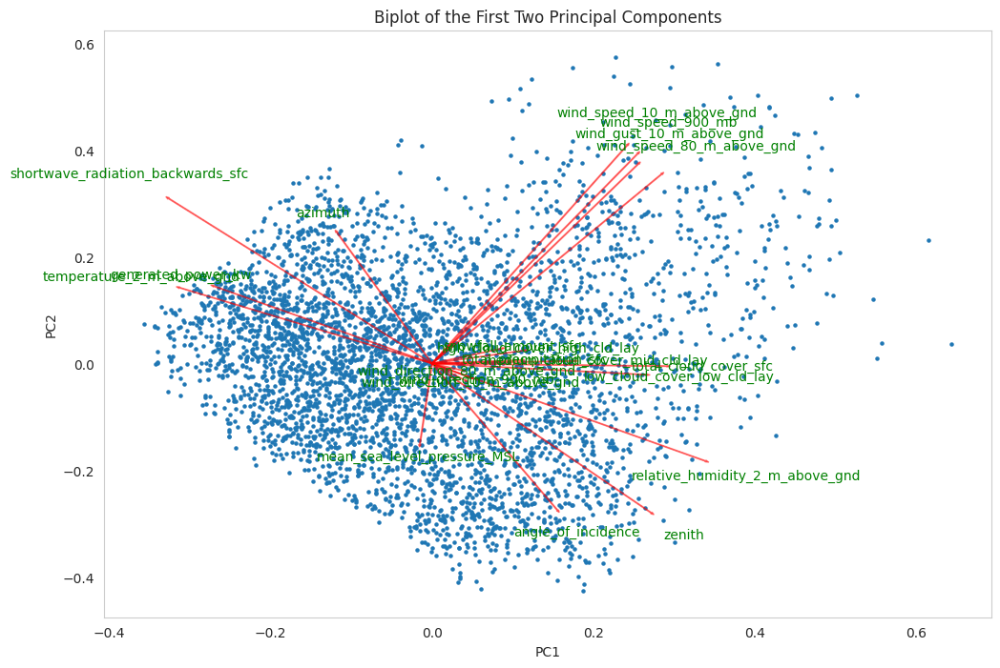

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler


scaler = StandardScaler()
scaled_data = scaler.fit_transform(dataframe)

pca = PCA(n_components=2)
pca_data = pca.fit_transform(scaled_data)

def biplot(score, coeff, labels=None):
    xs = score[:, 0]
    ys = score[:, 1]
    scalex = 1.0 / (xs.max() - xs.min())
    scaley = 1.0 / (ys.max() - ys.min())

    plt.scatter(xs * scalex, ys * scaley, s=5)
    for i in range(coeff.shape[0]):
        plt.arrow(0, 0, coeff[i, 0], coeff[i, 1], color='r', alpha=0.5)
        if labels is not None:
            plt.text(coeff[i, 0] * 1.15, coeff[i, 1] * 1.15, labels[i], color='g', ha='center', va='center')

    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plt.title('Biplot of the First Two Principal Components')
    plt.grid()


plt.figure(figsize=(12, 8))
biplot(pca_data[:, 0:2], np.transpose(pca.components_[0:2, :]), labels=dataframe.columns)
plt.show()